In [57]:
import pandas as pd
import numpy as np
import os
import json
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objects as go
from scipy.spatial.transform import Rotation as R
from pyquaternion import Quaternion

In [58]:
BASE_DIR = 'data/3d-object-detection-for-autonomous-vehicles/'

In [59]:
train = pd.read_csv(os.path.join(BASE_DIR, 'train.csv'))
train.head()

,Id,PredictionString
0,db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce...,2680.2830359778527 698.1969292852777 -18.04776...
1,edf37c1fb1024ba0c1f53ebbf10b6797f781199a9f0e4e...,1208.642684768659 1585.1812946970927 -23.56236...
2,1841b7895e7163a2c1be87e8c1740e759a910cd59157b8...,848.9346793681768 2587.2870557176507 -20.15995...
3,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,1994.4320280494098 1128.30164336183 -18.054752...
4,b909de93ba19460eeea58074ccc1ef6bb302435f37b48c...,1030.3877156973385 1667.13131694941 -23.764820...


In [60]:
object_columns = ['sample_id', 'object_id', 'center_x', 'center_y', 'center_z', 'width', 'length', 'height', 'yaw', 'class_name']
objects = []
for sample_id, ps in train.values[:]:
    object_params = ps.split()
    n_objects = len(object_params)
    for i in range(n_objects // 8):
        x, y, z, w, l, h, yaw, c = tuple(object_params[i * 8: (i + 1) * 8])
        objects.append([sample_id, i, x, y, z, w, l, h, yaw, c])
train_objects = pd.DataFrame(objects, columns=object_columns)

In [61]:
numerical_cols = ['object_id', 'center_x', 'center_y', 'center_z', 'width', 'length', 'height', 'yaw']
train_objects[numerical_cols] = np.float32(train_objects[numerical_cols].values)
train_objects.head()

,sample_id,object_id,center_x,center_y,center_z,width,length,height,yaw,class_name
0,db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce...,0.0,2680.282959,698.196899,-18.047768,2.064,5.488,2.053,2.604164,car
1,db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce...,1.0,2691.997559,660.801636,-18.674259,1.818,4.570,1.608,-0.335176,car
2,db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce...,2.0,2713.607422,694.403503,-18.589972,1.779,4.992,1.620,2.579456,car
3,db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce...,3.0,2679.986816,706.910156,-18.349594,1.798,3.903,1.722,2.586166,car
4,db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce...,4.0,2659.352051,719.417480,-18.442999,1.936,4.427,1.921,2.601799,car


# db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce..
분석

In [62]:
def check_file(file):
    file_path = os.path.join(BASE_DIR, 'train_data', f'{file}.json')

    with open(file_path, 'r') as f:
        data = json.load(f)
    df = pd.DataFrame(data)
    return df

In [63]:
sample_data = check_file('sample_data')
calibrated_sensor = check_file('calibrated_sensor')
sensor = check_file('sensor')
sample_data.head()

,is_key_frame,prev,fileformat,token,timestamp,next,ego_pose_token,sample_token,filename,calibrated_sensor_token,width,height
0,True,d190078ec7869ad5c9e5417371aa3b45eb1c22804a0a29...,bin,ad87e1763749cc8562cca68e2046db128185c80c3e7599...,1.549921e+15,8182fb6868baf63c245a4994b7f3034a7d281d1928a784...,d90d278f2084ae64c98b0aa2dd8d4f83c023f1313beeae...,fd5f1c634b59e3b4e0f7a5c48c768a7d334a63221fced3...,lidar/host-a007_lidar1_1233956183701948366.bin,3b463530b5bae9698c9cc803c1731c36abd359a7296e23...,NaN,NaN
1,True,83f6f61cb6f2fc9b985cc23bd5613219eee7da390cd083...,bin,ea079138d89f3887b2bfcddfe16b747e2ec7a366ce66b3...,1.551742e+15,c291c5e9c1c70363496e304e964a33036cace6d14c177e...,97c348ec54ca0cfc892361595513d34d19e53583f97832...,c60dc70e93949cbefdda68813cf024fe8e9103bc8a68d6...,lidar/host-a008_lidar1_1235777221601281486.bin,2dba2d3171d7c60b847d65d96babfd7efb487428fa5a3c...,NaN,NaN
2,True,44555daed204fea486ec10ea1747432501b9f06fe93041...,jpeg,454c65ee6c297d64b17852b4c56def9781a84dcb8558a8...,1.550705e+15,d4b751751ca5424375d0faf3d22b9af83e7c84e1598ba0...,dce9c81e168db4f6fa442cc0bd484a4926dfe73946ba59...,254cea140f7d14fc86e73f789794fb73f81c05831d40f3...,images/host-a007_cam6_1234740264650905006.jpeg,30fcfa36375c0d36fce508cd04c9b1dd07ac283eb87352...,2048.0,864.0
3,True,de75f3f347742035f2442f4a5fa0334946642daa2d07d8...,jpeg,779018e1f92debcf5c5c28e9577677c6595679780bdf9b...,1.546901e+15,4796998aae092f295fe4f96ce57fc673e3292c7b0368ac...,bb93bbeb3b6d151c805729dba52d4c0c0070f20376090b...,810503d8ca51e9692021ecb56e2b2f2098beaf396cd207...,images/host-a007_cam3_1230936242299360006.jpeg,76e7bb72dd96cb18f5c75abae3b5bab5e41bd4aac39445...,1224.0,1024.0
4,True,a208568472ef6719faa2540622ada30b004583de9153f4...,jpeg,d966960819eb0aca2883cd3c8d8c5e2540bda952a8cada...,1.549650e+15,1a82a24dafde93234579ae59f48498a8436361cc641a64...,53f6821330f6bc07603db70fde1a96b25bd919471e923c...,119b8c4bbaf1493bebaaa7d823934a8a3f5a80fb095630...,images/host-a004_cam2_1233685223917652006.jpeg,aac6241dd5e28264de261422696af2037868c5133d9329...,1224.0,1024.0


In [64]:
sample_data_object = sample_data[sample_data['sample_token'] == train_objects['sample_id'].values[150]]
sample_data_object.head(15)

,is_key_frame,prev,fileformat,token,timestamp,next,ego_pose_token,sample_token,filename,calibrated_sensor_token,width,height
28197,True,9feb70eceb1596be3cb4f1ddc84785780efd32cf97ac6a...,bin,d86829038b19c9cb7fbec9bbad3275c09c881efa9ccc69...,1.552085e+15,57ce3bd4e4c297239f1d08ef48da668e3ed83082d13991...,6629f5f8e015712c10cff166e39e2f9b067d7c1291d20b...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,lidar/host-a017_lidar1_1236119820301396806.bin,4aa35fda1166a0f588470705aa1dc3a7c52c96f08c0c45...,NaN,NaN
87476,True,9a3e8716efb248b026650927692e895c04d090e3a63fb9...,jpeg,e0b6b5fa68ee2a5ee57a6bca6a75e94af95fa0412e6e90...,1.552085e+15,158fcfeed047d825cc2d7a82ab81e64ee5f3d090c93835...,b3fb4809361ec07e5333750eb5eea5061194be82537c8d...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,images/host-a017_cam6_1236119820250938006.jpeg,82329244dd358fb8c6293d0ba35094695b6bf8c57b002c...,2048.0,864.0
87697,True,b0023bd820bbf46f42c0ea83fa3a812b37006b10fe1ec5...,jpeg,40554f0e53e32813e4892584fd0fcd193402f1a859bd62...,1.552085e+15,1465f044d379825a60e6b57e72cb01d72a03de84bd5847...,ab93720394f138fbeecd59e934b3c05601087bb9bffd33...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,images/host-a017_cam2_1236119820217560006.jpeg,74bc6fb38f6ffdd097c4507f8a05e621cb85097711cbec...,1224.0,1024.0
104554,True,98fc75f4f448dc33e532755778254b4f0c0c20123a5686...,jpeg,6da8e953bc08e5cf2518b67c51187b5829129945b7a34d...,1.552085e+15,a3139624a1c30049e3a9004a1802c62df2e9209af31fbc...,a9144c8420d4638fd1a79e252c5b1006bd8e5ea0dd1919...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,images/host-a017_cam3_1236119820200918006.jpeg,2c2eade4444151094f2874412318f9a9decf02ab6551b0...,1224.0,1024.0
121100,True,52293f30466397e5795d6729019ba10db636026dc089c4...,jpeg,784abb4d37bc93df7db7d0d0b47529ef7d7705205c0692...,1.552085e+15,16b9f069146e18f7bad113d0a363a671e0cd59a0368402...,2c0b61e554310214ccb25ece3f61a9bf7c697fdcf06137...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,images/host-a017_cam0_1236119820250894006.jpeg,b2d2a304dd44eba603d9a16505cc902b794767edbd1dbd...,1224.0,1024.0
147217,True,a488ba386596e17ae8319f89e3b486124be2fb6bb8bd60...,jpeg,d32c890abe93e4a7c62710dd0b822db90e63ab9c6cdcbc...,1.552085e+15,7cb77c6e49d03b348baa6c4cc613018c97d84850a64883...,dd6640969185a8ad60a44f5fd3b408a713a51e9532717c...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,images/host-a017_cam4_1236119820284166006.jpeg,92782c3f510bacebcc3b3a82c5d9b62936a51a99d0a897...,1224.0,1024.0
151760,True,78e9ee3bd6b35525bd8a710c9daa75afc56fcd0b4e63e0...,jpeg,750df07b8bb2c590cf23a8775998e282196cc57a1f56c5...,1.552085e+15,4fe4322381eae4f87f9f5a7225095f1a67ee1dcdb1db19...,5253efc16474b23cc6da3902c1251f44a615477de42afe...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,images/host-a017_cam1_1236119820234294006.jpeg,ed7eef8b766f175393fcb0c8fac131e99ffa7f91afe5ce...,1224.0,1024.0
155413,True,eb9054c6b189b7d03d8b7074580bf5f9d86f6b5ba24276...,jpeg,6abe9063edd040dd879f5ad96c2d3585d411487ec1e8b2...,1.552085e+15,58d4ace8d2c62a5a5b463f06276ef1648bb8b478fa1237...,e1657894d83d4948c78865ad393cb96079925c78724f1b...,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,images/host-a017_cam5_1236119820267500006.jpeg,3d94c075ab6b01d947972219a4692871547cdb9fd085ff...,1224.0,1024.0


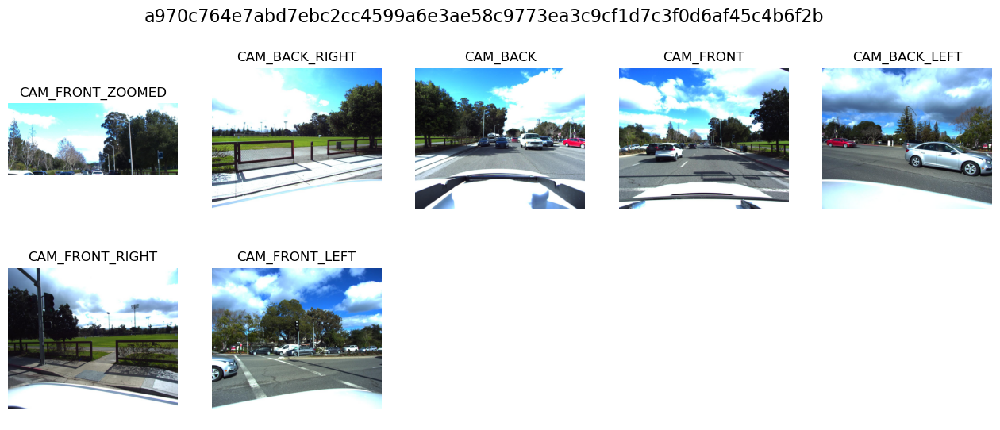

In [65]:
fig, ax = plt.subplots(2, 5, figsize=(16, 6))
fig.suptitle(sample_data_object['sample_token'].values[0], fontsize=16)

jpeg_objects = sample_data_object[sample_data_object['filename'].str.endswith('.jpeg')]
for idx, i in enumerate(jpeg_objects['filename'].values):
    i = i.split('/')[-1]
    img = plt.imread(os.path.join(BASE_DIR, 'train_images', i))
    ax[idx // 5, idx % 5].imshow(img)
    ax[idx // 5, idx % 5].axis('off')
for i in range(len(jpeg_objects['filename'].values), 10):
    ax[i // 5, i % 5].axis('off')
for idx, i in enumerate(jpeg_objects['calibrated_sensor_token'].values):
    calibrated_sensor_data = calibrated_sensor[calibrated_sensor['token'] == i]
    sensor_data = sensor[sensor['token'] == calibrated_sensor_data['sensor_token'].values[0]]
    ax[idx // 5, idx % 5].set_title(sensor_data['channel'].values[0])
    
plt.show()

In [66]:
bin_objects = sample_data_object[sample_data_object['filename'].str.endswith('.bin')]
print(bin_objects['filename'].values)

['lidar/host-a017_lidar1_1236119820301396806.bin']


In [67]:
def visualize_lidar_plotly(points):
    fig = go.Figure(data=[
        go.Scatter3d(
            x=points[:, 0],
            y=points[:, 1],
            z=points[:, 2],
            mode='markers',
            marker=dict(
                size=1,
                color=points[:, 3],  # Intensity
                colorscale='Viridis',
                opacity=0.5
            )
        )
    ])
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='manual',
            aspectratio=dict(x=200, y=200, z=15),
            camera=dict(
                eye=dict(x=0, y=0, z=20)
            )
        ),
        margin=dict(l=0, r=0, b=0, t=0)
    )
    fig.show()

def load_lidar_data(file_path):
    lidar_data = np.fromfile(file_path, dtype=np.float32)
    lidar_data = lidar_data.reshape(-1, 5)
    return lidar_data


In [68]:
for i in bin_objects['filename']:
    print(i)
    bin_data = bin_objects[bin_objects['filename'] == i]
    calibrated_sensor_data = calibrated_sensor[calibrated_sensor['token'] == bin_data['calibrated_sensor_token'].values[0]]
    sensor_data = sensor[sensor['token'] == calibrated_sensor_data['sensor_token'].values[0]]
    print(sensor_data['channel'].values)
    i = i.split('/')[-1]
    lidar_points = load_lidar_data(os.path.join(BASE_DIR, 'train_lidar', i))
    visualize_lidar_plotly(lidar_points)

lidar/host-a017_lidar1_1236119820301396806.bin
['LIDAR_TOP']


# host-a101_lidar1_1242144892502687076.bin 에 대해 Object Detection 수행

In [75]:
bin_name = 'lidar/host-a017_lidar1_1236119820301396806.bin'
lidar_points = load_lidar_data(os.path.join(BASE_DIR, 'train_lidar', bin_name.split('/')[-1]))
# visualize_lidar_plotly(lidar_points)

In [76]:
object_axis = train_objects[train_objects['sample_id'] == sample_data_object[sample_data_object['filename'] == bin_name]['sample_token'].values[0]]
object_axis.head()

,sample_id,object_id,center_x,center_y,center_z,width,length,height,yaw,class_name
125,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,0.0,1994.432007,1128.301636,-18.054752,2.200,5.390,2.187,2.587330,car
126,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,1.0,2057.282227,1085.825928,-18.277023,1.851,4.665,1.513,2.586479,car
127,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,2.0,2059.909912,1095.983643,-17.802631,2.705,8.573,3.227,2.599243,bus
128,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,3.0,2003.444458,1130.812500,-18.576067,1.712,4.768,1.533,2.605111,car
129,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,4.0,1930.368408,1162.558838,-18.479456,2.060,4.717,1.730,2.608612,car


In [77]:
def visualize_lidar_with_bounding_boxes(points, bounding_boxes):
    fig = go.Figure(data=[
        go.Scatter3d(
            x=points[:, 0],
            y=points[:, 1],
            z=points[:, 2],
            mode='markers',
            marker=dict(
                size=1,
                color=points[:, 3],
                colorscale='Viridis',
                opacity=0.5
            )
        )
    ])

    for box in bounding_boxes:
        cx, cy, cz, w, l, h, yaw = box
        corners = get_bounding_box_corners(cx, cy, cz, w, l, h, yaw)

        fig.add_trace(
            go.Mesh3d(
                x=corners[:, 0],
                y=corners[:, 1],
                z=corners[:, 2],
                color='red',
                opacity=0.3,
                alphahull=0
            )
        )
    
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='manual',
            aspectratio=dict(x=200, y=200, z=15),
            camera=dict(
                eye=dict(x=2800, y=700, z=-18)
            )
        ),
        margin=dict(l=0, r=0, b=0, t=0)
    )
    fig.show()

def get_bounding_box_corners(cx, cy, cz, l, w, h, yaw):
    rotation_mat = np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw), np.cos(yaw), 0],
        [0, 0, 1]
    ])
    corners = np.array([
        [-w / 2, -l / 2, -h / 2],
        [w / 2, -l / 2, -h / 2],
        [w / 2, l / 2, -h / 2],
        [-w / 2, l / 2, -h / 2],
        [-w / 2, -l / 2, h / 2],
        [w / 2, -l / 2, h / 2],
        [w / 2, l / 2, h / 2],
        [-w / 2, l / 2, h / 2],
    ])
    rotated_corners = np.dot(corners, rotation_mat.T)
    translated_corners = rotated_corners + np.array([cx, cy, cz])
    # translated_corners =  corners + np.array([cx, cy, cz])

    return translated_corners


In [79]:
bounding_volumes_array = np.array(object_axis[['center_x', 'center_y', 'center_z', 'width', 'length', 'height', 'yaw']].values)

# 카메라 위치 변환
ego_pose = check_file('ego_pose')
ego_pose_token = sample_data_object[sample_data_object['filename'] == bin_name]['ego_pose_token'].values[0]
print('ego_pose_token : ', ego_pose_token)
ego_pose_data = ego_pose[ego_pose['token'] == ego_pose_token]

calibrated_sensor_data = calibrated_sensor[calibrated_sensor['token'] == bin_objects[bin_objects['filename'] == bin_name]['calibrated_sensor_token'].values[0]]
sensor_rotation = np.array(calibrated_sensor_data['rotation'].values[0])
sensor_translation = np.array(calibrated_sensor_data['translation'].values[0])

translation_ego_pose = np.array(ego_pose_data['translation'].values[0])
rotation_ego_pose = np.array(ego_pose_data['rotation'].values[0])

rotation_matrix = Quaternion(rotation_ego_pose).rotation_matrix

rotation_matrix2 = Quaternion(sensor_rotation).rotation_matrix

lidar_points[:, 0:3] = (rotation_matrix2 @ lidar_points[:, 0:3].T).T
lidar_points[:, 0:3] += sensor_translation
lidar_points[:, 0:3] = (rotation_matrix @ lidar_points[:, 0:3].T).T
lidar_points[:, 0:3] += translation_ego_pose

ego_pose_token :  6629f5f8e015712c10cff166e39e2f9b067d7c1291d20b6b25fbc2350f23d148


In [80]:
visualize_lidar_with_bounding_boxes(lidar_points, bounding_volumes_array)